In [48]:
# common
import os
import sys
import argparse
import json
from matplotlib.backends.backend_pdf import PdfPages
import wandb
import datetime
import pickle as pkl
import numpy as np
import warnings
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from scipy.ndimage import gaussian_filter, gaussian_filter1d

def add_to_sys_path(root_dir):
    for dirpath, dirnames, filenames in os.walk(root_dir):
        sys.path.append(dirpath)        
root_dir = '/home/jovyan/pablo_tostado/bird_song/enSongDec/'
add_to_sys_path(root_dir)

# sklearn
from sklearn.metrics import mean_squared_error

# torch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

# ensongdec
from FFNNmodel import FeedforwardNeuralNetwork, ffnn_predict
from neural_audio_dataset import NeuralAudioDataset
import utils.audio_utils as au
import utils.signal_utils as su
import utils.encodec_utils as eu

from notebooks.decoder_test_functions import load_model_statedict, get_original_reconstructed_audio, plot_spectrogram

# songbirdcore
import songbirdcore.spikefinder.spike_analysis_helper as sh
import songbirdcore.spikefinder.filtering_helper as fh
import songbirdcore.utils.audio_spectrogram_utils as auts
import songbirdcore.utils.label_utils as luts
import songbirdcore.utils.plot_utils as puts

# EncoDec
from encodec import EncodecModel
from encodec.utils import convert_audio

# Tim S. noise reduce
import noisereduce as nr

In [16]:
from sklearn.cross_decomposition import CCA

def fit_CCA_model(X, Y, n_components):
    """
    X = [samples * features]
    Y = [samples * features]
    n_components = number of CCA dimensions
    """
    cca = CCA(n_components=n_components)
    cca.fit(X, Y)
    return cca

def X_transform_to_canonical(X, cca):
    '''Equivalent to X_c = cca.transform(X)'''
    X_norm = (X - cca._x_mean)/cca._x_std
    X_c = X_norm @ cca.x_rotations_
    return X_c

def Y_transform_to_canonical(Y, cca):
    '''Equivalent to _, Y_c = cca.transform(X, Y)'''
    Y_norm = (Y - cca._y_mean)/cca._y_std
    Y_c = Y_norm @ cca.y_rotations_
    return Y_c

def X_transform_to_Y(X, cca):
    '''Align X data to Y data'''
    X_c = X_transform_to_canonical(X, cca)
    Xy_norm_recovered = X_c @ np.linalg.inv(cca.y_rotations_)
    Xy_recovered = (Xy_norm_recovered * cca._y_std) + cca._y_mean
    return Xy_recovered

def Y_transform_to_X(Y, cca):
    '''Align Y data to X data'''
    Y_c = Y_transform_to_canonical(Y, cca)
    Yx_norm_recovered = Y_c @ np.linalg.inv(cca.x_rotations_)
    Yx_recovered = (Yx_norm_recovered * cca._x_std) + cca._x_mean
    return Yx_recovered

def X_transform_to_X(X, cca):
    '''Align X data to X data'''
    X_c = X_transform_to_canonical(X, cca)
    Xx_norm_recovered = X_c @ np.linalg.inv(cca.x_rotations_)
    Xx_recovered = (Xx_norm_recovered * cca._x_std) + cca._x_mean
    return Xx_recovered

def Y_transform_to_Y(Y, cca):
    '''Align Y data to Y data'''
    Y_c = Y_transform_to_canonical(Y, cca)
    Yy_norm_recovered = Y_c @ np.linalg.inv(cca.y_rotations_)
    Yy_recovered = (Yy_norm_recovered * cca._y_std) + cca._y_mean
    return Yy_recovered


In [17]:
models_checkpoints_dir = '/home/jovyan/pablo_tostado/bird_song/enSongDec/ensongdec/models_checkpoints/'
model_timestamp = '000101'
model_extension = '.pt'  
model_files = [file for file in os.listdir(models_checkpoints_dir) if file.endswith(model_extension)]
model_filename = next((file for file in model_files if model_timestamp in file), None)
print('Loading model: ', model_filename)


metadata_extension = '.json' 
metadata_files = [file for file in os.listdir(models_checkpoints_dir) if file.endswith(metadata_extension)]
exp_metadata_file = next((file for file in metadata_files if model_filename[:-3] in file), None)
print(exp_metadata_file)


with open(models_checkpoints_dir + exp_metadata_file, 'rb') as file:
    
    experiment_metadata = json.load(file)
    # Experiment params
    # dataset_dir = experiment_metadata['dataset_dir']
    dataset_dir = '/home/jovyan/pablo_tostado/bird_song/enSongDec/data/'
    dataset_filename = experiment_metadata['dataset_filename']
    train_idxs = experiment_metadata['train_idxs']
    test_idxs = experiment_metadata['test_idxs']
    model_layers = experiment_metadata['layers']
    neural_mode = experiment_metadata['neural_mode']
    neural_key = experiment_metadata['neural_key']   
    latent_mode = experiment_metadata['latent_mode']
    dimensionality = experiment_metadata['dimensionality']
    neural_history_ms = experiment_metadata["neural_history_ms"]
    gaussian_smoothing_sigma = experiment_metadata["gaussian_smoothing_sigma"]    
    max_temporal_shift_ms = experiment_metadata["max_temporal_shift_ms"]
    noise_level = experiment_metadata["noise_level"]
    transform_probability = experiment_metadata["transform_probability"]    
    dropout_prob = experiment_metadata["dropout_prob"]
    batch_size = experiment_metadata["batch_size"]
    learning_rate = experiment_metadata["learning_rate"]
    
    print('train_idxs: ', train_idxs, ' - test_ixs: ', test_idxs, ' - model_layers: ', model_layers) 


# --------- LOAD DATA --------- #

# Open the file in binary read mode ('rb') and load the content using pickle
with open(dataset_dir + dataset_filename + '.pkl', 'rb') as file:
    data_dict = pkl.load(file)

# Extarct data and align spaces
neural_original_traces = data_dict['neural_dict']['original_neural_traces'][neural_key][latent_mode][neural_key+'_dim'+str(dimensionality)]['trajectories']
neural_complimentary_traces = data_dict['neural_dict']['complimentary_neural_traces'][neural_key][latent_mode][neural_key+'_dim'+str(dimensionality)]['trajectories']
# Trajectory labels
number_bin_samples = int(np.floor(data_dict['audio_labels'].shape[1] / neural_original_traces.shape[2]))
trajectory_labels = sh.downsample_list_2d(data_dict['audio_labels'], number_bin_samples, mode='mode')

print(neural_original_traces.shape, neural_complimentary_traces.shape, trajectory_labels.shape)


Loading model:  TRAJECTORIES_z_r12r13_21_20240502_201905_ra_all_latent_stability_dataset_FFNN_20240503_000101.pt
TRAJECTORIES_z_r12r13_21_20240502_201905_ra_all_latent_stability_dataset_FFNN_20240503_000101_metadata.json
train_idxs:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36]  - test_ixs:  [37, 38, 39, 40, 41, 42, 43, 44, 45, 46]  - model_layers:  [36, 64, 64, 128]
(47, 12, 179) (47, 12, 179) (47, 179)


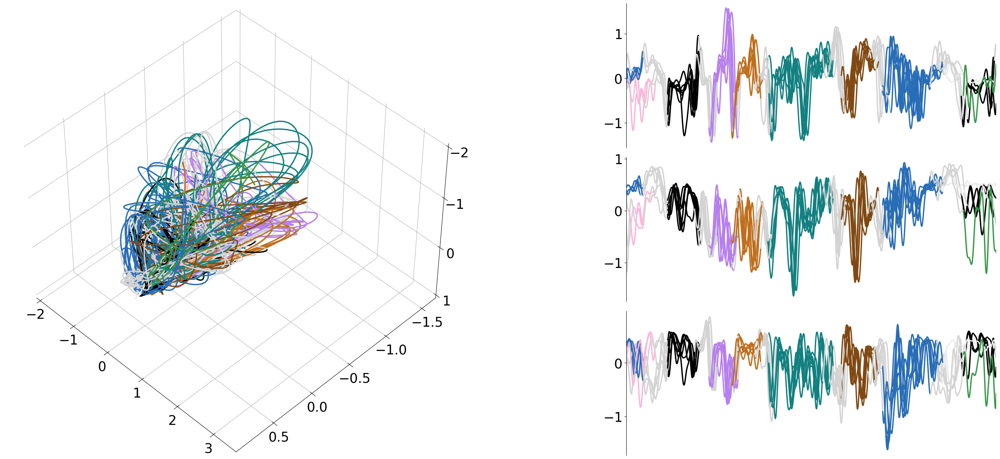

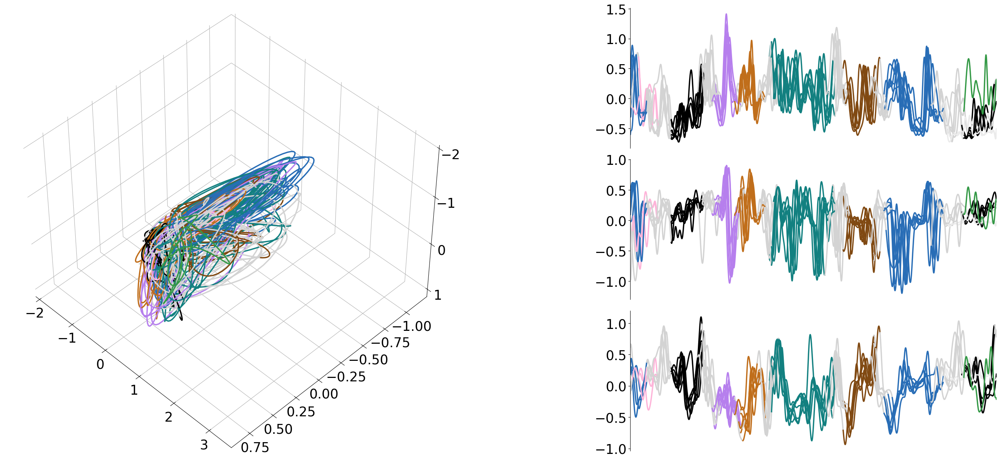

In [18]:
trajectories = neural_original_traces
# Smooth trajectories and labels
interpolation_multiplier = 10
interpolation_order = 5
smooth_trj = np.array([np.apply_along_axis(luts.TextgridLabels.signal_smoother, 1, trajectories[mot], interp_multiplier=interpolation_multiplier, interp_order=interpolation_order) for mot in range(len(trajectories))] )
smooth_trj_lbs = np.apply_along_axis(luts.TextgridLabels.list_expander, 1, trajectory_labels, expand_multiplier=interpolation_multiplier)

f = puts.plot_3D_trajectories(smooth_trj, trajectory_labels=smooth_trj_lbs, dimensions2plot=[0, 1, 2], num_trials2plot=7)


trajectories = neural_complimentary_traces
# Smooth trajectories and labels
interpolation_multiplier = 10
interpolation_order = 5
smooth_trj = np.array([np.apply_along_axis(luts.TextgridLabels.signal_smoother, 1, trajectories[mot], interp_multiplier=interpolation_multiplier, interp_order=interpolation_order) for mot in range(len(trajectories))] )
smooth_trj_lbs = np.apply_along_axis(luts.TextgridLabels.list_expander, 1, trajectory_labels, expand_multiplier=interpolation_multiplier)

f = puts.plot_3D_trajectories(smooth_trj, trajectory_labels=smooth_trj_lbs, dimensions2plot=[0, 1, 2], num_trials2plot=7)

# Use MEAN trajectory (skipping t_pre and t_post) to fit CCA model to dimensions

12
(140, 12) (140, 12)


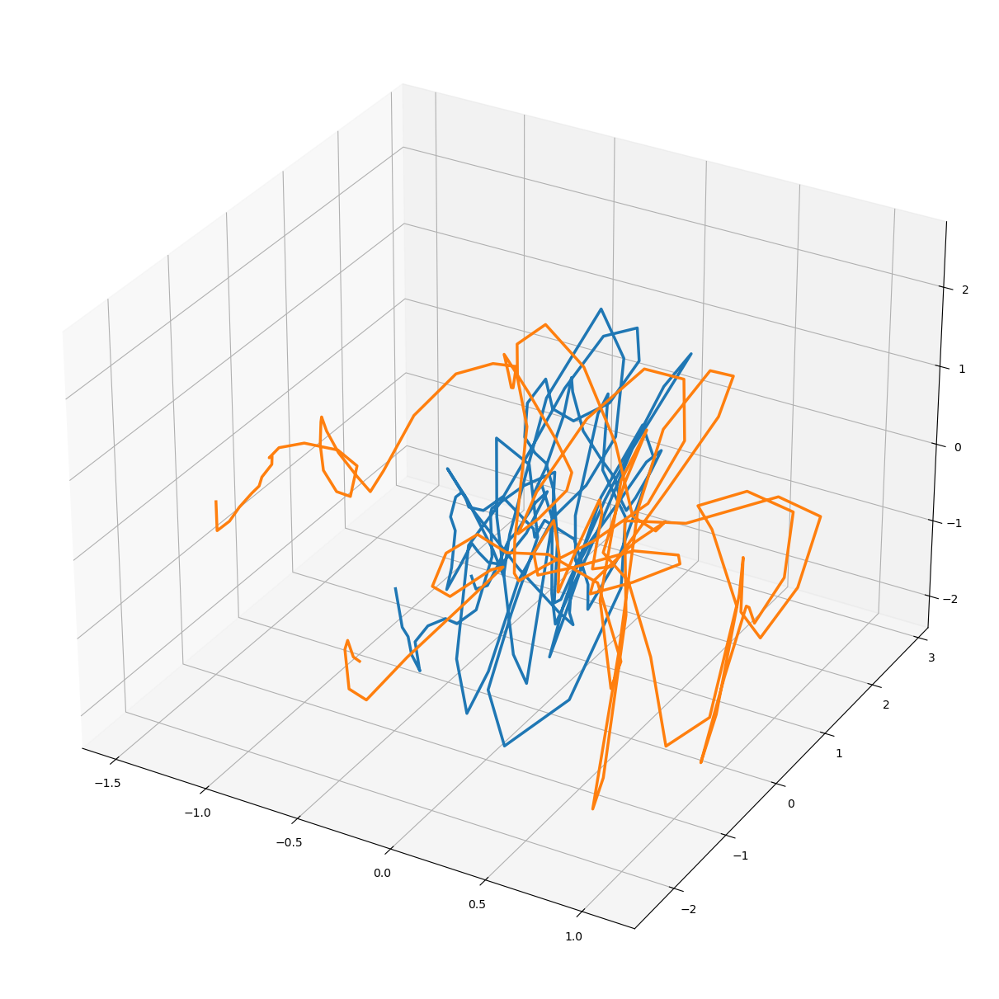

In [19]:

from_samples = int(data_dict['t_pre'] * data_dict['fs_neural'])
to_samples = int(data_dict['t_post'] * data_dict['fs_neural'])
original_mean_trajectories = np.mean(neural_original_traces, axis=0)[:, from_samples:to_samples]
complimentary_mean_trajectories = np.mean(neural_complimentary_traces, axis=0)[:, from_samples:to_samples]

n_components = original_mean_trajectories.shape[0]
print(n_components)

X = original_mean_trajectories.T
Y = complimentary_mean_trajectories.T

# Fit CCA
cca = fit_CCA_model(X, Y, n_components=n_components)

X_c = X_transform_to_canonical(X, cca)
Y_c = Y_transform_to_canonical(Y, cca)
# X_c, Y_c = cca.transform(X, Y)

print(X_c.shape, Y_c.shape)

from matplotlib.gridspec import GridSpec
fig = plt.figure(constrained_layout=True, figsize=(30, 12))
gs = GridSpec(3, 2, figure=fig, width_ratios=[2, 1])
gs.update(wspace=0, hspace=0)
ax = fig.add_subplot(gs[:,0], projection='3d')

trajectories = X_c.T
ax.plot3D(trajectories[0], trajectories[1], trajectories[2], linewidth=2.5)

trajectories = Y_c.T
ax.plot3D(trajectories[0], trajectories[1], trajectories[2], linewidth=2.5)


12
(47, 12, 179)


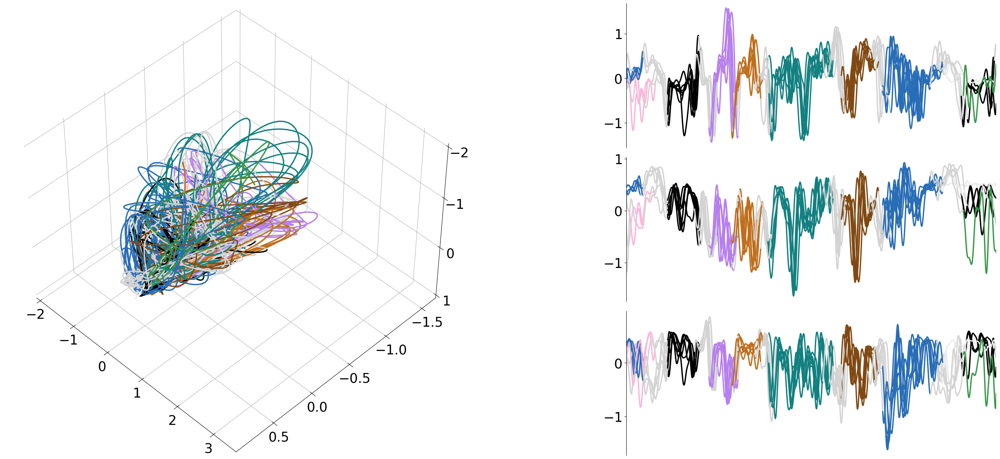

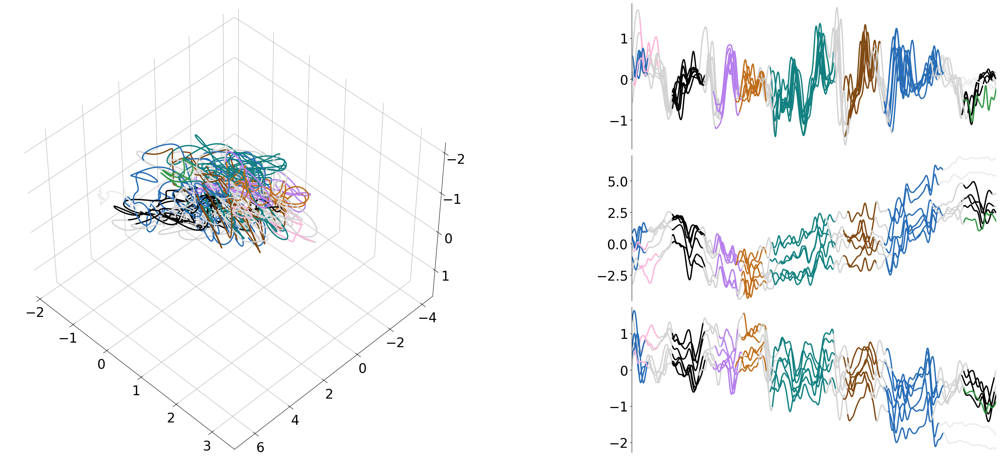

In [20]:
n_components = original_mean_trajectories.shape[0]
print(n_components)

X = original_mean_trajectories.T
Y = complimentary_mean_trajectories.T

# Fit CCA
cca = fit_CCA_model(X, Y, n_components=n_components)
aligned_complimentary_traces = np.array([Y_transform_to_X(Y.T, cca).T for Y in neural_complimentary_traces])
print(aligned_complimentary_traces.shape)

trajectories = neural_original_traces
# Smooth trajectories and labels
interpolation_multiplier = 10
interpolation_order = 5
smooth_trj = np.array([np.apply_along_axis(luts.TextgridLabels.signal_smoother, 1, trajectories[mot], interp_multiplier=interpolation_multiplier, interp_order=interpolation_order) for mot in range(len(trajectories))] )
smooth_trj_lbs = np.apply_along_axis(luts.TextgridLabels.list_expander, 1, trajectory_labels, expand_multiplier=interpolation_multiplier)
f = puts.plot_3D_trajectories(smooth_trj, trajectory_labels=smooth_trj_lbs, dimensions2plot=[0, 1, 2], num_trials2plot=7)

trajectories = aligned_complimentary_traces
# Smooth trajectories and labels
interpolation_multiplier = 10
interpolation_order = 5
smooth_trj = np.array([np.apply_along_axis(luts.TextgridLabels.signal_smoother, 1, trajectories[mot], interp_multiplier=interpolation_multiplier, interp_order=interpolation_order) for mot in range(len(trajectories))] )
smooth_trj_lbs = np.apply_along_axis(luts.TextgridLabels.list_expander, 1, trajectory_labels, expand_multiplier=interpolation_multiplier)
f = puts.plot_3D_trajectories(smooth_trj, trajectory_labels=smooth_trj_lbs, dimensions2plot=[0, 1, 2], num_trials2plot=7)

# Use all concatenated trials (skipping t_pre and t_post) to fit CCA model to dimensions

(12, 6580) (12, 6580)


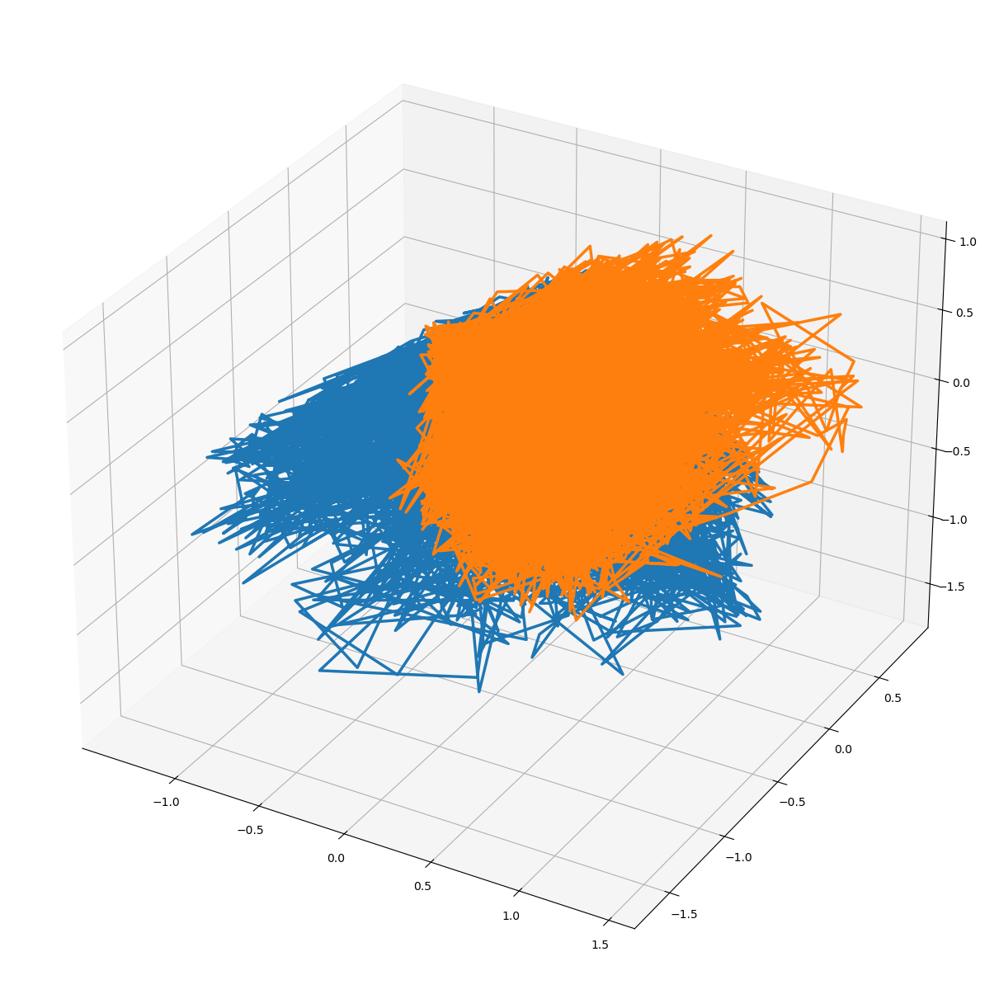

In [21]:
# Use all concatenated trials (skipping t_pre and t_post) to fit CCA model to dimensions
from_samples = int(data_dict['t_pre'] * data_dict['fs_neural'])
to_samples = int(data_dict['t_post'] * data_dict['fs_neural'])

reshaped_original_traces = neural_original_traces[:, :, from_samples:to_samples].transpose(1, 2, 0).reshape(12, -1)
reshaped_complimentary_traces = neural_complimentary_traces[:, :, from_samples:to_samples].transpose(1, 2, 0).reshape(12, -1)
print(reshaped_original_traces.shape, reshaped_complimentary_traces.shape)

from matplotlib.gridspec import GridSpec
fig = plt.figure(constrained_layout=True, figsize=(30, 12))
gs = GridSpec(3, 2, figure=fig, width_ratios=[2, 1])
gs.update(wspace=0, hspace=0)
ax = fig.add_subplot(gs[:,0], projection='3d')

trajectories = reshaped_original_traces
ax.plot3D(trajectories[0], trajectories[1], trajectories[2], linewidth=2.5)

trajectories = reshaped_complimentary_traces
ax.plot3D(trajectories[0], trajectories[1], trajectories[2], linewidth=2.5)



12
(12, 6580) (12, 6580)


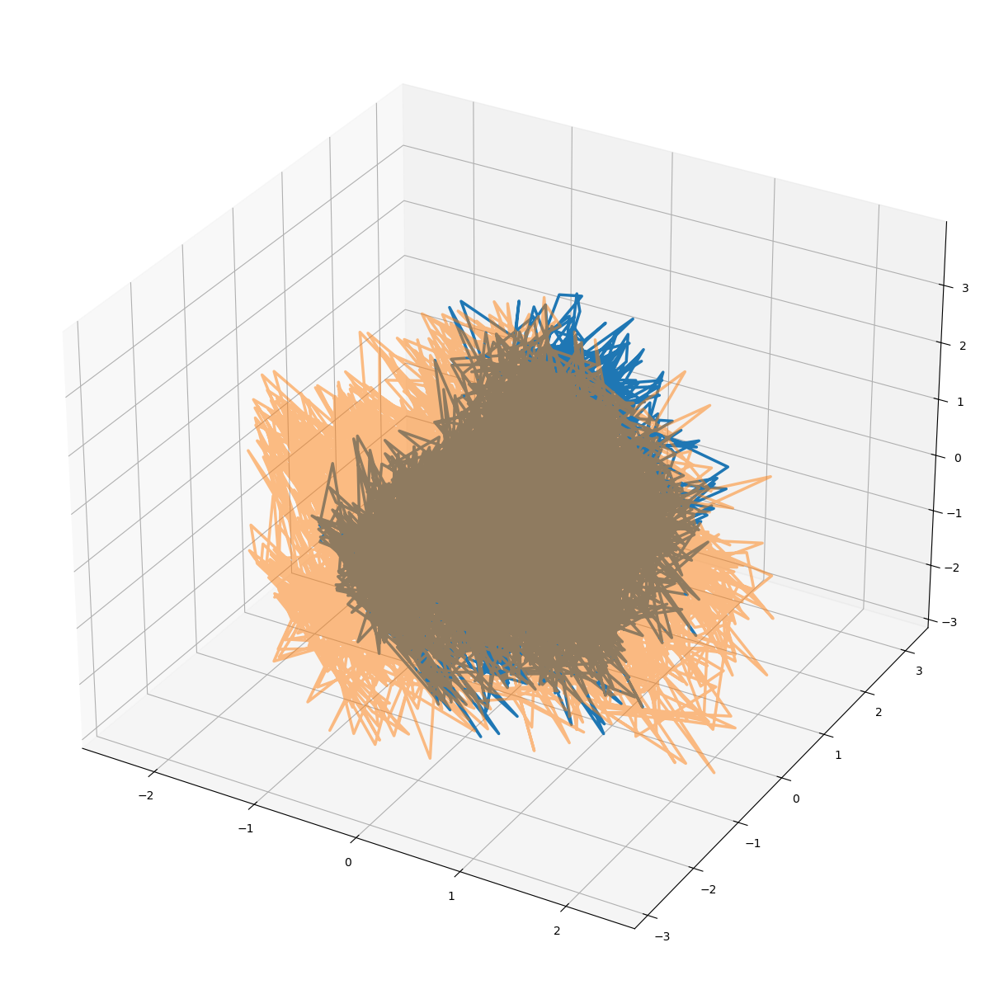

In [22]:
# print(reshaped_original_traces.shape, reshaped_complimentary_traces.shape)

n_components = reshaped_original_traces.shape[0]
print(n_components)

X = reshaped_original_traces.T
Y = reshaped_complimentary_traces.T

# Fit CCA
cca = fit_CCA_model(X, Y, n_components=n_components)
X_c = X_transform_to_canonical(X, cca).T
Y_c = Y_transform_to_canonical(Y, cca).T
# X_c, Y_c = cca.transform(X, Y)
print(X_c.shape, Y_c.shape)

from matplotlib.gridspec import GridSpec
fig = plt.figure(constrained_layout=True, figsize=(30, 12))
gs = GridSpec(3, 2, figure=fig, width_ratios=[2, 1])
gs.update(wspace=0, hspace=0)
ax = fig.add_subplot(gs[:,0], projection='3d')

trajectories = X_c
ax.plot3D(trajectories[0], trajectories[1], trajectories[2], linewidth=2.5)

trajectories = Y_c
ax.plot3D(trajectories[0], trajectories[1], trajectories[2], linewidth=2.5, alpha=0.5)

12
(47, 12, 179)


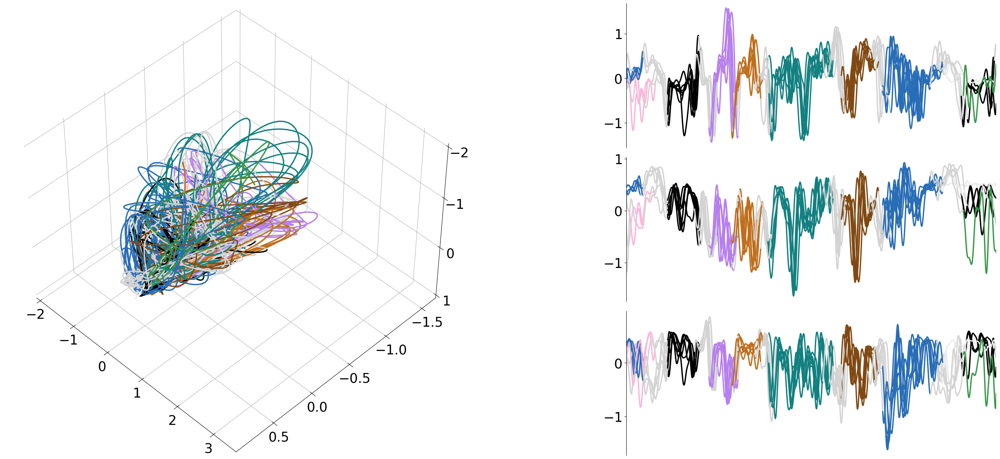

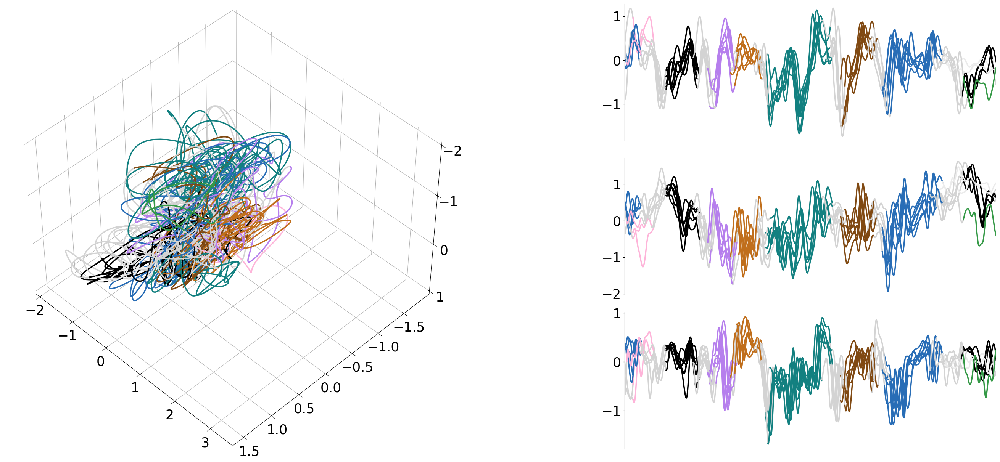

In [23]:
n_components = reshaped_original_traces.shape[0]
print(n_components)

X = reshaped_original_traces.T
Y = reshaped_complimentary_traces.T

# Fit CCA
cca = fit_CCA_model(X, Y, n_components=n_components)
aligned_complimentary_traces = np.array([Y_transform_to_X(Y.T, cca).T for Y in neural_complimentary_traces])
print(aligned_complimentary_traces.shape)

trajectories = neural_original_traces
# Smooth trajectories and labels
interpolation_multiplier = 10
interpolation_order = 5
smooth_trj = np.array([np.apply_along_axis(luts.TextgridLabels.signal_smoother, 1, trajectories[mot], interp_multiplier=interpolation_multiplier, interp_order=interpolation_order) for mot in range(len(trajectories))] )
smooth_trj_lbs = np.apply_along_axis(luts.TextgridLabels.list_expander, 1, trajectory_labels, expand_multiplier=interpolation_multiplier)
f = puts.plot_3D_trajectories(smooth_trj, trajectory_labels=smooth_trj_lbs, dimensions2plot=[0, 1, 2], num_trials2plot=7)

trajectories = aligned_complimentary_traces
# Smooth trajectories and labels
interpolation_multiplier = 10
interpolation_order = 5
smooth_trj = np.array([np.apply_along_axis(luts.TextgridLabels.signal_smoother, 1, trajectories[mot], interp_multiplier=interpolation_multiplier, interp_order=interpolation_order) for mot in range(len(trajectories))] )
smooth_trj_lbs = np.apply_along_axis(luts.TextgridLabels.list_expander, 1, trajectory_labels, expand_multiplier=interpolation_multiplier)
f = puts.plot_3D_trajectories(smooth_trj, trajectory_labels=smooth_trj_lbs, dimensions2plot=[0, 1, 2], num_trials2plot=7)

In [16]:
from sklearn.cross_decomposition import CCA

def fit_CCA_model(X, Y, n_components):
    """
    X = [samples * features]
    Y = [samples * features]
    n_components = number of CCA dimensions
    """
    cca = CCA(n_components=n_components)
    cca.fit(X, Y)
    return cca

def X_transform_to_canonical(X, cca):
    '''Equivalent to X_c = cca.transform(X)'''
    X_norm = (X - cca._x_mean)/cca._x_std
    X_c = X_norm @ cca.x_rotations_
    return X_c

def Y_transform_to_canonical(Y, cca):
    '''Equivalent to _, Y_c = cca.transform(X, Y)'''
    Y_norm = (Y - cca._y_mean)/cca._y_std
    Y_c = Y_norm @ cca.y_rotations_
    return Y_c

def X_transform_to_Y(X, cca):
    '''Align X data to Y data'''
    X_c = X_transform_to_canonical(X, cca)
    Xy_norm_recovered = X_c @ np.linalg.inv(cca.y_rotations_)
    Xy_recovered = (Xy_norm_recovered * cca._y_std) + cca._y_mean
    return Xy_recovered

def Y_transform_to_X(Y, cca):
    '''Align Y data to X data'''
    Y_c = Y_transform_to_canonical(Y, cca)
    Yx_norm_recovered = Y_c @ np.linalg.inv(cca.x_rotations_)
    Yx_recovered = (Yx_norm_recovered * cca._x_std) + cca._x_mean
    return Yx_recovered

def X_transform_to_X(X, cca):
    '''Align X data to X data'''
    X_c = X_transform_to_canonical(X, cca)
    Xx_norm_recovered = X_c @ np.linalg.inv(cca.x_rotations_)
    Xx_recovered = (Xx_norm_recovered * cca._x_std) + cca._x_mean
    return Xx_recovered

def Y_transform_to_Y(Y, cca):
    '''Align Y data to Y data'''
    Y_c = Y_transform_to_canonical(Y, cca)
    Yy_norm_recovered = Y_c @ np.linalg.inv(cca.y_rotations_)
    Yy_recovered = (Yy_norm_recovered * cca._y_std) + cca._y_mean
    return Yy_recovered


In [39]:
def load_model_statedict_align_complimentary_space(models_checkpoints_dir, model_filename):
    
    # models_checkpoints_dir = '/home/jovyan/pablo_tostado/bird_song/enSongDec/ensongdec/models_checkpoints/'
    # model_filename = "TRAJECTORIES_z_r12r13_21_20240502_201905_ra_all_latent_stability_dataset_FFNN_20240503_000101.pt"
    
    # --------- LOAD EXPERIMENT --------- #
    
    metadata_extension = '.json' 
    metadata_files = [file for file in os.listdir(models_checkpoints_dir) if file.endswith(metadata_extension)]
    exp_metadata_file = next((file for file in metadata_files if model_filename[:-3] in file), None)
    print(exp_metadata_file)
    
    with open(models_checkpoints_dir + exp_metadata_file, 'rb') as file:
        experiment_metadata = json.load(file)
    
    # Experiment params
    # dataset_dir = experiment_metadata['dataset_dir']
    dataset_dir = '/home/jovyan/pablo_tostado/bird_song/enSongDec/data/'
    dataset_filename = experiment_metadata['dataset_filename']
    train_idxs = experiment_metadata['train_idxs']
    test_idxs = experiment_metadata['test_idxs']
    model_layers = experiment_metadata['layers']
    neural_mode = experiment_metadata['neural_mode']
    neural_key = experiment_metadata['neural_key']
    # latent_mode = experiment_metadata['latent_mode']
    # dimensionality = experiment_metadata['dimensionality']
    neural_history_ms = experiment_metadata["neural_history_ms"]
    gaussian_smoothing_sigma = experiment_metadata["gaussian_smoothing_sigma"]    
    max_temporal_shift_ms = experiment_metadata["max_temporal_shift_ms"]
    noise_level = experiment_metadata["noise_level"]
    transform_probability = experiment_metadata["transform_probability"]    
    dropout_prob = experiment_metadata["dropout_prob"]
    batch_size = experiment_metadata["batch_size"]
    learning_rate = experiment_metadata["learning_rate"]
    
    print('train_idxs: ', train_idxs, ' - test_ixs: ', test_idxs, ' - model_layers: ', model_layers)    
    
    # --------- LOAD DATA --------- #
    
    # Open the file in binary read mode ('rb') and load the content using pickle
    with open(dataset_dir + dataset_filename + '.pkl', 'rb') as file:
        data_dict = pkl.load(file)
    
    # Extarct data and align spaces
    if neural_mode == 'RAW' or neural_mode == 'TX':
        neural_original_traces = data_dict['neural_dict']['original_neural_traces'][neural_key]
        neural_complimentary_traces = data_dict['neural_dict']['complimentary_neural_traces'][neural_key]
        
    elif neural_mode == 'TRAJECTORIES':
        latent_mode = experiment_metadata['latent_mode']
        dimensionality = experiment_metadata['dimensionality']
        neural_original_traces = data_dict['neural_dict']['original_neural_traces'][neural_key][latent_mode][neural_key+'_dim'+str(dimensionality)]['trajectories']
        neural_complimentary_traces = data_dict['neural_dict']['complimentary_neural_traces'][neural_key][latent_mode][neural_key+'_dim'+str(dimensionality)]['trajectories']

    print(neural_mode, neural_original_traces.shape, neural_complimentary_traces.shape)
    
    # Use mean trajectory (skipping t_pre and t_post) to fit CCA model to dimensions
    n_dims = neural_original_traces.shape[1]
    print('n_dims: ', n_dims)
    
    from_samples = int(data_dict['t_pre'] * data_dict['fs_neural'])
    to_samples = int(data_dict['t_post'] * data_dict['fs_neural'])
    reshaped_original_traces = neural_original_traces[:, :, from_samples:to_samples].transpose(1, 2, 0).reshape(n_dims, -1).T
    reshaped_complimentary_traces = neural_complimentary_traces[:, :, from_samples:to_samples].transpose(1, 2, 0).reshape(n_dims, -1).T
    print(reshaped_original_traces.shape, reshaped_complimentary_traces.shape)
    

    # Fit CCA
    cca = fit_CCA_model(reshaped_original_traces, reshaped_complimentary_traces, n_components=n_dims)
    # Align complimentary trajectories to original trajectorie's space
    neural_array = np.array([Y_transform_to_X(Y.T, cca).T for Y in neural_complimentary_traces])
    
    audio_motifs = data_dict['audio_motifs']
    fs_audio = data_dict['fs_audio']
    fs_neural = data_dict['fs_neural']
    
    # Calculate the duration based on the last dimension of the arrays and their sampling rates
    trial_length_neural = (neural_array.shape[-1] / fs_neural)*1000
    trial_length_audio = (audio_motifs.shape[-1] / fs_audio)*1000
    
    # Check the durations of the neural/audio data are equal and raise a warning if they aren't
    print('Length of neural trials: {} ms, length of audio trials: {} ms. '.format(trial_length_neural, trial_length_audio))
    if trial_length_neural != trial_length_audio:
        warnings.warn("WARNING: Neural data duration and audio motifs duration are different in this dataset!")
    

    # --------- PROCESS AUDIO --------- #
    
    b, a = fh.load_filter_coefficients_matlab(
        '/home/jovyan/pablo_tostado/repos/songbirdcore/songbirdcore/filters/butter_bp_250Hz-8000hz_order4_sr25000.mat')
    audio_motifs = fh.noncausal_filter_2d(audio_motifs, b=b, a=a)
    
    # Reduce noise
    for m in range(len(audio_motifs)):
        audio_motifs[m] = nr.reduce_noise(audio_motifs[m], sr=fs_audio)
    
    
    # --------- INSTANTIATE ENCODEC --------- #
    
    # Instantiate a pretrained EnCodec model
    encodec_model = EncodecModel.encodec_model_48khz()
    # bandwidth = 24kbps for 48kHz model (n_q=16)
    encodec_model.set_target_bandwidth(24.0)
    
    # Embed motifs
    audio_embeddings, audio_codes, scales = eu.encodec_encode_audio_array_2d(audio_motifs, fs_audio, encodec_model)
    
    
    # --------- PROCESS NEURAL --------- #
    
    # Resample neural data to match audio embeddings
    samples_neural = neural_array.shape[2]
    samples_embeddings = audio_embeddings.shape[2]
    history_size = samples_neural//samples_embeddings
    
    # Match neural to audio samples (! Different for raw spiketrains vs trajectories)
    if neural_mode == 'RAW' or neural_mode == 'TX':
        print('Pre-processing neural data as RAW')
        # Gaussian kernel along the temporal dimension of the spiketrains
        neural_array = gaussian_filter1d(neural_array, sigma=gaussian_smoothing_sigma, axis=2) 
        # Downsample to spikerate at given bin_size
        neural_array = sh.downsample_list_3d(neural_array, history_size, mode='sum')  
    elif neural_mode == 'TRAJECTORIES':
        print('Pre-processing neural data as TRAJECTORIES')
        # Downsample by interpolation
        neural_array = np.array([su.resample_by_interpolation_2d(n, samples_neural, samples_embeddings) for n in neural_array])
    else:
        raise ValueError("Neural mode must be 'RAW' or 'TRAJECTORIES'")
    
    bin_length = trial_length_neural / neural_array.shape[2] # ms
    history_size = int(neural_history_ms // bin_length) # Must be minimum 1
    print('Using {} bins of neural data history.'.format(history_size))
    
    # --------- PREPARE DATALOADERS --------- #
    
    # Split the data into train and test sets
    # train_neural = neural_array[train_idxs]  
    # train_audio = audio_embeddings[train_idxs]
    test_neural = neural_array[test_idxs]  
    test_audio = audio_embeddings[test_idxs]
    
    # Create dataset objects
    max_temporal_shift_bins = int(max_temporal_shift_ms // bin_length) # Temporal jitter for data augmentation
    
    # train_dataset = NeuralAudioDataset(train_neural, 
    #                                    train_audio, 
    #                                    history_size, 
    #                                    max_temporal_shift=max_temporal_shift_bins,
    #                                    noise_level=noise_level,
    #                                    transform_probability=transform_probability)
    
    test_dataset = NeuralAudioDataset(test_neural, 
                                      test_audio, 
                                      history_size, 
                                      max_temporal_shift=0,
                                      noise_level=0,
                                      transform_probability=0)
    
    # print('Train samples: ', len(train_dataset))
    print('Test samples: ', len(test_dataset))
    
    # Prepare data loaders
    # train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    
    # --------- LOAD MODEL --------- #
    
    # Define the paths for the model checkpoint
    model_checkpoint_path = model_filename
    
    # Load the model and optimizer's state dicts from the checkpoint
    checkpoint = torch.load(models_checkpoints_dir + model_checkpoint_path)
    ffnn_model = FeedforwardNeuralNetwork(model_layers)
    ffnn_model.load_state_dict(checkpoint['model_state_dict'])
    
    optimizer = optim.AdamW(ffnn_model.parameters(), lr=learning_rate)
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    
    return ffnn_model, test_dataset, test_loader, fs_audio, encodec_model, scales

spiketrains_halved_alinged HVC
Loading model:  RAW_z_w12m7_20_20240509_050826_hvc_all_latent_stability_dataset_FFNN_20240509_052938.pt
RAW_z_w12m7_20_20240509_050826_hvc_all_latent_stability_dataset_FFNN_20240509_052938_metadata.json
train_idxs:  [0, 1, 2, 3, 4, 5, 6, 7]  - test_ixs:  [8, 9]  - model_layers:  [114, 64, 64, 128]
RAW (10, 57, 21000) (10, 57, 21000)
n_dims:  57
(150000, 57) (150000, 57)
Length of neural trials: 700.0 ms, length of audio trials: 700.0 ms. 
Pre-processing neural data as RAW
Using 2 bins of neural data history.
Test samples:  206
(34334,) (34334,)
spiketrains_halved_alinged RA
Loading model:  RAW_z_w12m7_20_20240509_051627_ra_all_latent_stability_dataset_FFNN_20240509_053009.pt
RAW_z_w12m7_20_20240509_051627_ra_all_latent_stability_dataset_FFNN_20240509_053009_metadata.json
train_idxs:  [0, 1, 2, 3, 4, 5, 6, 7]  - test_ixs:  [8, 9]  - model_layers:  [172, 64, 64, 128]
RAW (10, 86, 21000) (10, 86, 21000)
n_dims:  86
(150000, 86) (150000, 86)
Length of neural 

(Text(0, 0.5, ''), [])

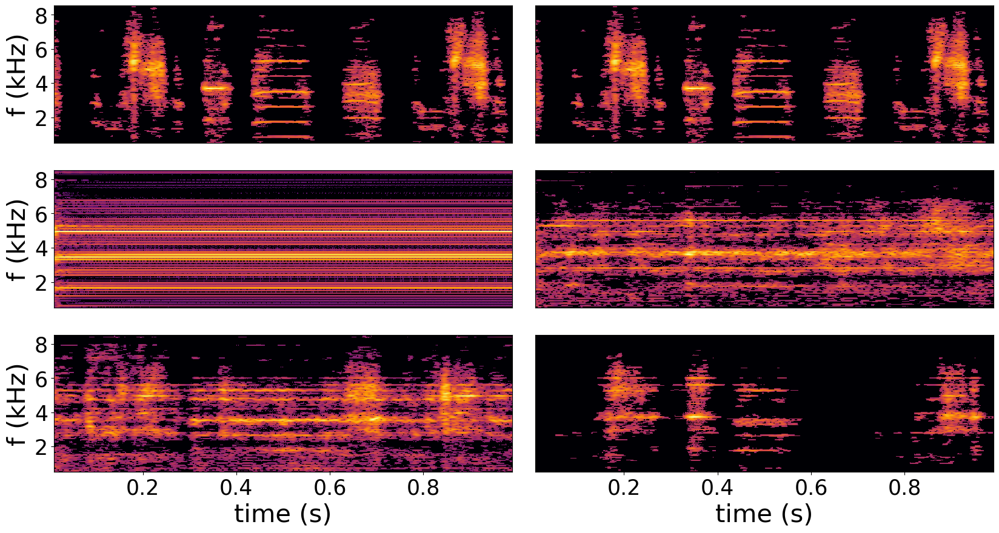

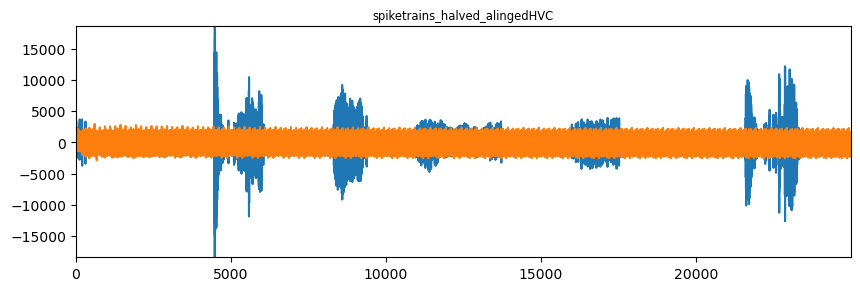

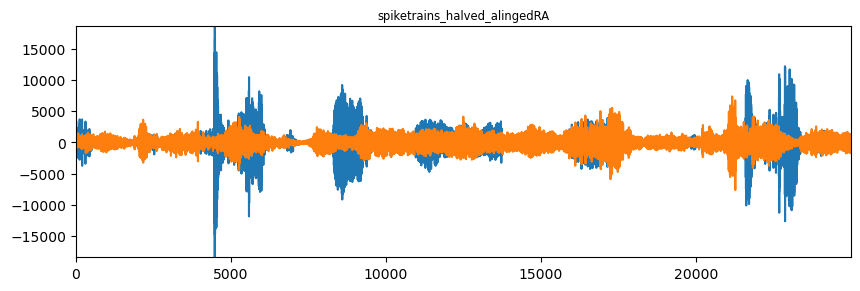

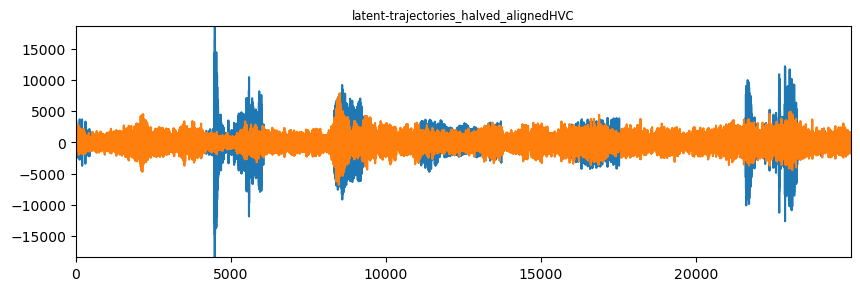

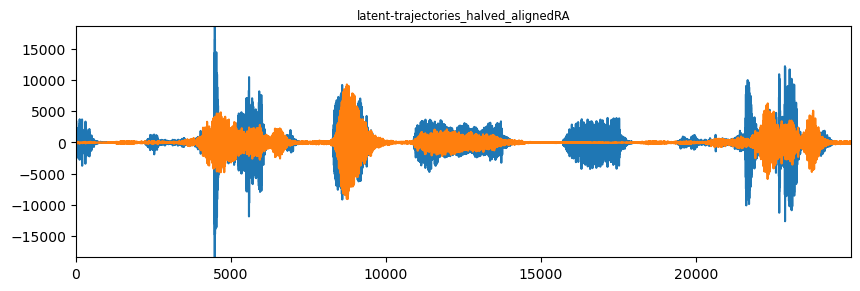

In [45]:
bird = 'z_w12m7_20'
models_dict = {
    'spiketrains_halved_alinged': {
        'HVC': '20240509_052938',
        'RA': '20240509_053009'
    },
    
    'latent-trajectories_halved_aligned': {
        'HVC': '20240509_053018',
        'RA': '20240509_053026'
    }
}


# pablo_tostado/bird_song/enSongDec/ensongdec/models_checkpoints/TRAJECTORIES_z_r12r13_21_20240502_201905_ra_all_latent_stability_dataset_FFNN_20240503_000101_figures.pdf
models_checkpoints_dir = '/home/jovyan/pablo_tostado/bird_song/enSongDec/ensongdec/models_checkpoints/'
column_names = ['model_name', 'nucleus', 'model', 'Spectrogram reconstruction error']
decoding_accuracy_df1 = pd.DataFrame(columns=column_names)

# Plotting setup
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(20, 10))
plt.subplots_adjust(wspace=0.05)

# Processing each model type and nucleus
for col, model_type in enumerate(models_dict):
    for row, nucleus in enumerate(models_dict[model_type]):

        if models_dict[model_type][nucleus]:
            print(model_type, nucleus)
    
            # Load model
            model_timestamp = models_dict[model_type][nucleus]
            model_extension = '.pt'  
            model_files = [file for file in os.listdir(models_checkpoints_dir) if file.endswith(model_extension)]
            model_filename = next((file for file in model_files if model_timestamp in file), None)
    
            print('Loading model: ', model_filename)
            ffnn_model, test_dataset, test_loader, fs_audio, encodec_model, scales = load_model_statedict_align_complimentary_space(models_checkpoints_dir, model_filename)
    
            # Reconstruct spectrogram
            scale = torch.mean(scales)
            original_audio, decoded_audio = get_original_reconstructed_audio(ffnn_model, test_dataset, test_loader, fs_audio, encodec_model, scale)
            
            print(original_audio.shape, decoded_audio.shape)
    
            # Calculate spectrogram reconstruction error
            s1 = su.normalize_signal(au.pretty_spectrogram(original_audio))
            s2 = su.normalize_signal(au.pretty_spectrogram(decoded_audio))
            spec_reconstruction_error = mean_squared_error(s1, s2, multioutput='raw_values')
            
            decoding_accuracy_df1.loc[len(decoding_accuracy_df1)] = [model_filename, nucleus, model_type, spec_reconstruction_error]
    
            # Plot original and reconstructed
            plot_s = 1
            plot_samples = int(plot_s*fs_audio)
            
            plt.subplots(nrows=1, figsize=(10, 3))
            plt.title(model_type + nucleus)
            plt.plot(original_audio[:plot_samples])
            plt.plot(decoded_audio[:plot_samples])
            
            xlabel = True if row == 1 else False
            # ylabel = True if col == 0 else False
            # plot_spectrogram(original_audio, fs_audio, plot_samples, ax=axes[row+1, col], xlabel=xlabel)
            plot_spectrogram(decoded_audio, fs_audio, plot_samples, ax=axes[row+1, col], xlabel=xlabel)

# Top row: repeat the plot of the original spectrograms in both columns
plot_spectrogram(original_audio, fs_audio, plot_samples, ax=axes[0, 0], xlabel=False, ylabel=True)
plot_spectrogram(original_audio, fs_audio, plot_samples, ax=axes[0, 1], xlabel=False, ylabel=False)
axes[1,1].set_ylabel(''), axes[1,1].set_yticks([])
axes[2,1].set_ylabel(''), axes[2,1].set_yticks([])

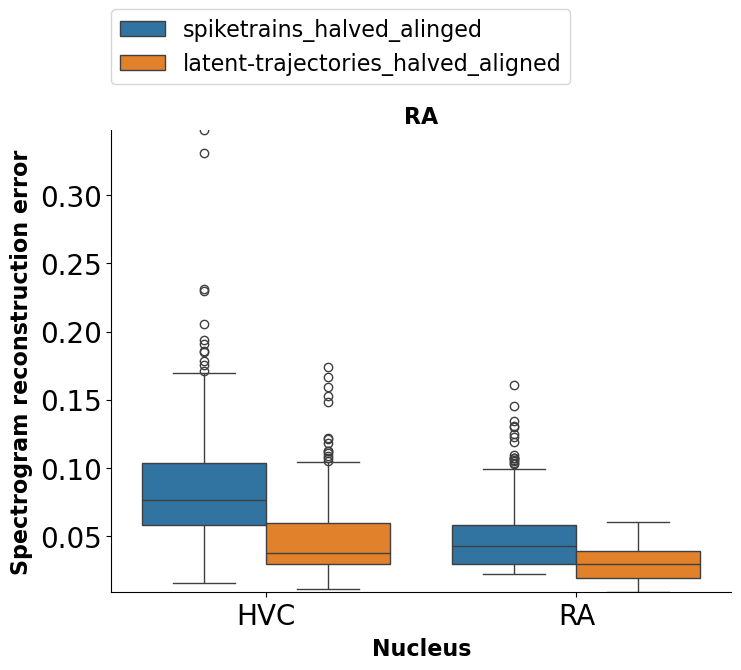

In [49]:
# Create separate rows for each value in the 'error' list
error_type = 'Spectrogram reconstruction error'
df_expanded = decoding_accuracy_df1.explode(error_type)
df_expanded[error_type] = pd.to_numeric(df_expanded[error_type])

# Create a box and whisker plot
fig, ax = plt.subplots(figsize=(8, 6))
sns.boxplot(x='nucleus', y=error_type, hue='model', data=df_expanded, notch=False)

# # Add significance bars
# for i, p_value in enumerate(significance.values()):
#     if p_value < 0.05:  # Adjust significance threshold as needed
#         ax.plot([i - 0.2, i + 0.2], [0.062, 0.062], lw=1.5, c='black')  # Adjust y-coordinate and appearance as needed

# # Add asterisks for statistical significance
# for i, p_value in enumerate(significance.values()):
#     if p_value < 0.05:  # Adjust significance threshold as needed
#         plt.text(i, 0.0625, "***", ha='center', va='bottom', fontsize=16)  # Adjust position and appearance as needed

plt.title(nucleus, fontsize=16, fontweight='bold')
plt.xlabel('Nucleus', fontsize=16, fontweight='bold')
plt.ylabel(error_type, fontsize=16, fontweight='bold')

# Remove top and right spines
# ax.set_ylim([0, 0.065])
# ax.set_xlim([-0.5, len(significance) - 0.5])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.tick_params(axis='both', which='major', labelsize=20)  # Adjust 'labelsize' as needed
plt.legend(fontsize='16', loc=(0,1.1)) 

plt.show()

spiketrains_halved_alinged HVC
Loading model:  RAW_z_r12r13_21_20240503_024021_hvc_all_latent_stability_dataset_FFNN_20240509_051853.pt
RAW_z_r12r13_21_20240503_024021_hvc_all_latent_stability_dataset_FFNN_20240509_051853_metadata.json
train_idxs:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36]  - test_ixs:  [37, 38, 39, 40, 41, 42, 43, 44, 45, 46]  - model_layers:  [75, 64, 64, 128]
RAW (47, 25, 26999) (47, 25, 26999)
n_dims:  25
(986953, 25) (986953, 25)
Length of neural trials: 899.9666666666667 ms, length of audio trials: 899.96 ms. 
Pre-processing neural data as RAW
Using 3 bins of neural data history.
Test samples:  1320
(220000,) (220000,)
spiketrains_halved_alinged RA
Loading model:  RAW_z_r12r13_21_20240502_201857_ra_all_latent_stability_dataset_FFNN_20240509_051849.pt
RAW_z_r12r13_21_20240502_201857_ra_all_latent_stability_dataset_FFNN_20240509_051849_metadata.json
train_idxs:  [0, 1, 

(Text(0, 0.5, ''), [])

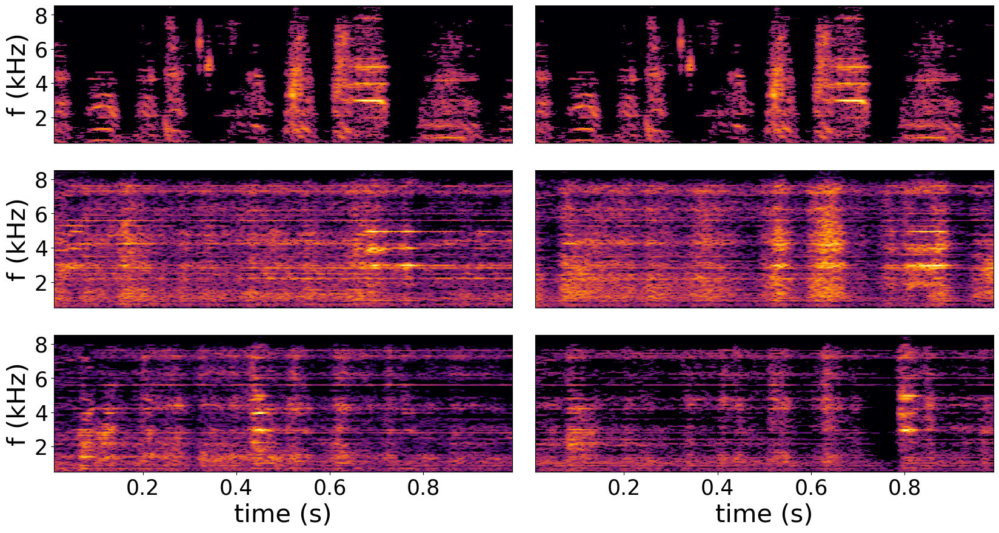

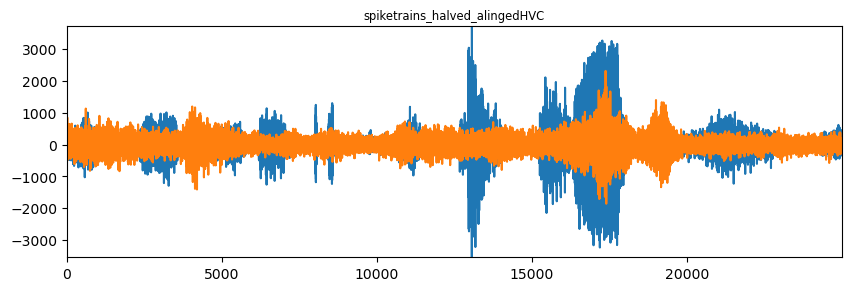

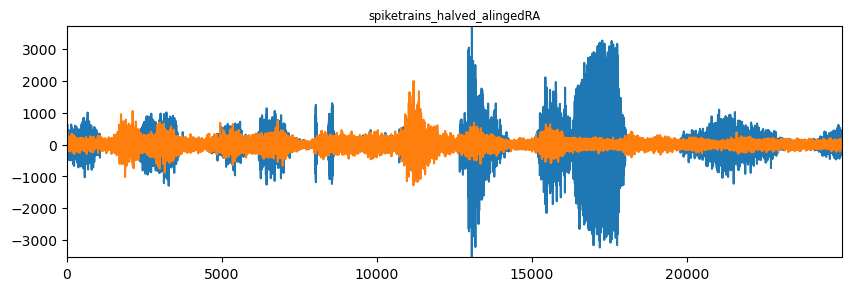

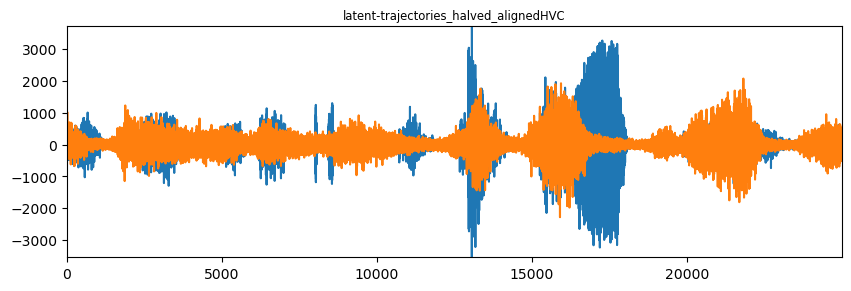

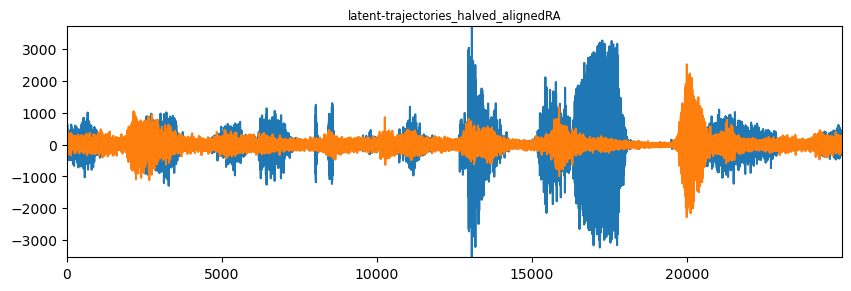

In [50]:
warnings.filterwarnings("ignore")

bird = 'z_r12r13_21'
models_dict = {
    'spiketrains_halved_alinged': {
        'HVC': '20240509_051853',
        'RA': '20240509_051849'
    },
    
    'latent-trajectories_halved_aligned': {
        'HVC': '20240508_230047',
        'RA': '20240503_000101'
    }
}


# pablo_tostado/bird_song/enSongDec/ensongdec/models_checkpoints/TRAJECTORIES_z_r12r13_21_20240502_201905_ra_all_latent_stability_dataset_FFNN_20240503_000101_figures.pdf
models_checkpoints_dir = '/home/jovyan/pablo_tostado/bird_song/enSongDec/ensongdec/models_checkpoints/'
column_names = ['model_name', 'nucleus', 'model', 'Spectrogram reconstruction error']
decoding_accuracy_df2 = pd.DataFrame(columns=column_names)

# Plotting setup
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(20, 10))
plt.subplots_adjust(wspace=0.05)

# Processing each model type and nucleus
for col, model_type in enumerate(models_dict):
    for row, nucleus in enumerate(models_dict[model_type]):

        if models_dict[model_type][nucleus]:
            print(model_type, nucleus)
    
            # Load model
            model_timestamp = models_dict[model_type][nucleus]
            model_extension = '.pt'  
            model_files = [file for file in os.listdir(models_checkpoints_dir) if file.endswith(model_extension)]
            model_filename = next((file for file in model_files if model_timestamp in file), None)
    
            print('Loading model: ', model_filename)
            ffnn_model, test_dataset, test_loader, fs_audio, encodec_model, scales = load_model_statedict_align_complimentary_space(models_checkpoints_dir, model_filename)
    
            # Reconstruct spectrogram
            scale = torch.mean(scales)
            original_audio, decoded_audio = get_original_reconstructed_audio(ffnn_model, test_dataset, test_loader, fs_audio, encodec_model, scale)
            
            print(original_audio.shape, decoded_audio.shape)
    
            # Calculate spectrogram reconstruction error
            s1 = su.normalize_signal(au.pretty_spectrogram(original_audio))
            s2 = su.normalize_signal(au.pretty_spectrogram(decoded_audio))
            spec_reconstruction_error = mean_squared_error(s1, s2, multioutput='raw_values')
            
            decoding_accuracy_df2.loc[len(decoding_accuracy_df2)] = [model_filename, nucleus, model_type, spec_reconstruction_error]
    
            # Plot original and reconstructed
            plot_s = 1
            plot_samples = int(plot_s*fs_audio)
            
            plt.subplots(nrows=1, figsize=(10, 3))
            plt.title(model_type + nucleus)
            plt.plot(original_audio[:plot_samples])
            plt.plot(decoded_audio[:plot_samples])
            
            xlabel = True if row == 1 else False
            # ylabel = True if col == 0 else False
            # plot_spectrogram(original_audio, fs_audio, plot_samples, ax=axes[row+1, col], xlabel=xlabel)
            plot_spectrogram(decoded_audio, fs_audio, plot_samples, ax=axes[row+1, col], xlabel=xlabel)

# Top row: repeat the plot of the original spectrograms in both columns
plot_spectrogram(original_audio, fs_audio, plot_samples, ax=axes[0, 0], xlabel=False, ylabel=True)
plot_spectrogram(original_audio, fs_audio, plot_samples, ax=axes[0, 1], xlabel=False, ylabel=False)
axes[1,1].set_ylabel(''), axes[1,1].set_yticks([])
axes[2,1].set_ylabel(''), axes[2,1].set_yticks([])

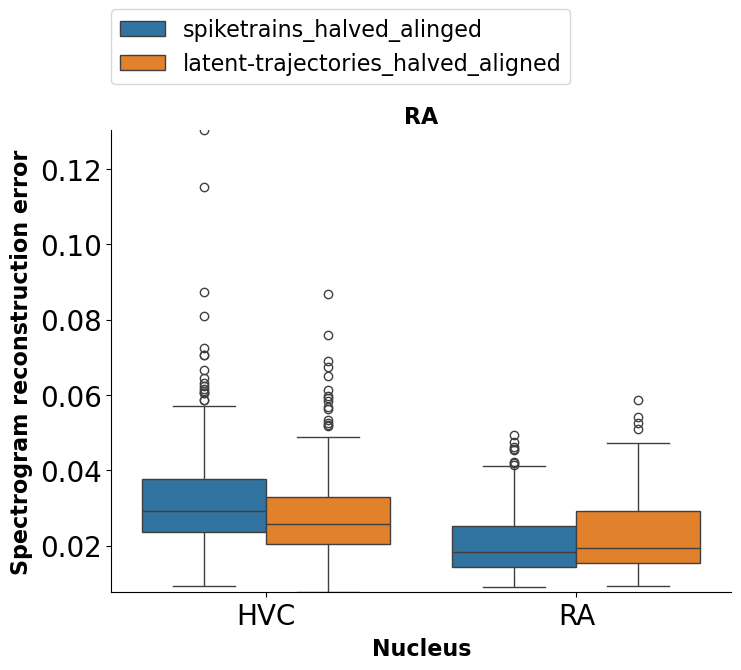

In [51]:
# Create separate rows for each value in the 'error' list
error_type = 'Spectrogram reconstruction error'
df_expanded = decoding_accuracy_df2.explode(error_type)
df_expanded[error_type] = pd.to_numeric(df_expanded[error_type])

# Create a box and whisker plot
fig, ax = plt.subplots(figsize=(8, 6))
sns.boxplot(x='nucleus', y=error_type, hue='model', data=df_expanded, notch=False)

# # Add significance bars
# for i, p_value in enumerate(significance.values()):
#     if p_value < 0.05:  # Adjust significance threshold as needed
#         ax.plot([i - 0.2, i + 0.2], [0.062, 0.062], lw=1.5, c='black')  # Adjust y-coordinate and appearance as needed

# # Add asterisks for statistical significance
# for i, p_value in enumerate(significance.values()):
#     if p_value < 0.05:  # Adjust significance threshold as needed
#         plt.text(i, 0.0625, "***", ha='center', va='bottom', fontsize=16)  # Adjust position and appearance as needed

plt.title(nucleus, fontsize=16, fontweight='bold')
plt.xlabel('Nucleus', fontsize=16, fontweight='bold')
plt.ylabel(error_type, fontsize=16, fontweight='bold')

# Remove top and right spines
# ax.set_ylim([0, 0.065])
# ax.set_xlim([-0.5, len(significance) - 0.5])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.tick_params(axis='both', which='major', labelsize=20)  # Adjust 'labelsize' as needed
plt.legend(fontsize='16', loc=(0,1.1)) 

plt.show()